In [1]:
from torch.utils.data import DataLoader, random_split
import torch
import torch.nn as nn
import numpy as np
import random
import os
import urllib.request
import tarfile
from tqdm import tqdm
import torchvision
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

## Drive Synchronization

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

def sync_drive(forward=True):
    if forward:
        !cp -r "/content/drive/MyDrive/mvp-semantic-mask-refinement/models" "/content"
        !cp -r "/content/drive/MyDrive/mvp-semantic-mask-refinement/dataloaders" "/content"
        !cp -r "/content/drive/MyDrive/mvp-semantic-mask-refinement/experiments" "/content"
        !cp -r "/content/drive/MyDrive/mvp-semantic-mask-refinement/utils" "/content"
    else:
        !cp -r "/content/checkpoints" "/content/drive/MyDrive/mvp-semantic-mask-refinement"


Mounted at /content/drive


In [3]:
sync_drive(True)

## Configuration

In [4]:
BATCH_SIZE = 64
NUM_EPOCHS = 20
LEARNING_RATE = 0.001
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
KEEP_NAMES = ['person']
CLASSES = len(KEEP_NAMES) + 1  # Background and Object
NUM_WORKERS = 2
PIN_MEMORY = torch.cuda.is_available()

DATASET_NAME = "coco-dataset"
MODEL_RESULTS_DIR = os.path.join("checkpoints", DATASET_NAME)
DATA_DIR = os.path.join("./data", DATASET_NAME)

os.makedirs(MODEL_RESULTS_DIR, exist_ok=True)
os.makedirs(DATA_DIR, exist_ok=True)

MEAN_RGB = [0.46021568775177, 0.44226375222206116, 0.41804927587509155]
STDDEV_RGB = [0.2755761742591858, 0.26984524726867676, 0.2828117907047272]

## Coco Dataset

### Download COCO annotations

In [5]:
from pathlib import Path
from pycocotools.coco import COCO

IMG_DIR = f"{DATA_DIR}/images"
MASK_DIR = f"{DATA_DIR}/masks"
ANN_FILE = f"{DATA_DIR}/annotations/instances_train2017.json"

os.makedirs(IMG_DIR, exist_ok=True)
os.makedirs(MASK_DIR, exist_ok=True)

# Download annotations (train+val) – contains instances_val2017.json
ann_zip = os.path.join(DATA_DIR, "annotations_trainval2017.zip")
if not os.path.exists(os.path.join(DATA_DIR, "annotations")):
    !wget -O "{ann_zip}" http://images.cocodataset.org/annotations/annotations_trainval2017.zip
    !unzip -q "{ann_zip}" -d "{DATA_DIR}"
    !rm "{ann_zip}"

coco = COCO(ANN_FILE)
print("Contents of /content/coco2017:", os.listdir(DATA_DIR))

--2025-12-04 13:37:03--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.182.99.1, 52.217.226.73, 16.182.103.105, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.182.99.1|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘./data/coco-dataset/annotations_trainval2017.zip’

./data/coco-dataset 100%[===================>] 241.19M  96.3MB/s    in 2.5s    

2025-12-04 13:37:06 (96.3 MB/s) - ‘./data/coco-dataset/annotations_trainval2017.zip’ saved [252907541/252907541]

loading annotations into memory...
Done (t=11.96s)
creating index...
index created!
Contents of /content/coco2017: ['images', 'masks', 'annotations']


### Filter to target classes

In [6]:
CLASS_MAP = {}
class_idx = 1
for name in KEEP_NAMES:
    cat_ids = coco.getCatIds(catNms=[name])
    if len(cat_ids) == 0:
        print(f"[WARN] No COCO category found for '{name}'")
        continue
    # Usually there is exactly one cat_id per name
    for cid in cat_ids:
        CLASS_MAP[cid] = class_idx
    class_idx += 1

pet_cat_ids = list(CLASS_MAP.keys())
NUM_CLASSES = class_idx  # includes background index 0

print("CLASS_MAP (coco_id -> class_idx):", CLASS_MAP)
print("Num classes including background:", NUM_CLASSES)

# ----------------------------------------------------------
# 2. Get union of image ids containing ANY of these classes
# ----------------------------------------------------------
target_img_ids = set()
for cid in pet_cat_ids:
    ids = coco.getImgIds(catIds=[cid])
    print(f"Category {cid} appears in {len(ids)} images")
    target_img_ids.update(ids)

print("Unique images with any of KEEP_NAMES:", len(target_img_ids))

# ----------------------------------------------------------
# 3. Build mapping: file_name -> img_id (only for our target set)
# ----------------------------------------------------------
filename_to_id = {}
for img_id in target_img_ids:
    info = coco.loadImgs(img_id)[0]
    filename_to_id[info["file_name"]] = img_id

print("Filename→ID entries:", len(filename_to_id))

CLASS_MAP (coco_id -> class_idx): {1: 1}
Num classes including background: 2
Category 1 appears in 64115 images
Unique images with any of KEEP_NAMES: 64115
Filename→ID entries: 64115


### Download images

In [7]:
import requests
from tqdm import tqdm
import os
from pathlib import Path
from concurrent.futures import ThreadPoolExecutor, as_completed
import random

imgs = random.choices(coco.loadImgs(list(target_img_ids)), k=40000)
print("Number of images to download:", len(imgs))


IMG_DIR = Path(IMG_DIR)  # make sure IMG_DIR is a Path
IMG_DIR.mkdir(parents=True, exist_ok=True)

def download_one(img_info):
    url = img_info["coco_url"]
    filename = img_info["file_name"]
    out_path = IMG_DIR / filename

    if out_path.exists():
        # already downloaded
        return filename, True, None

    try:
        r = requests.get(url, stream=True, timeout=10)
        r.raise_for_status()
        with open(out_path, "wb") as f:
            for chunk in r.iter_content(1024):
                if chunk:
                    f.write(chunk)
        return filename, True, None
    except Exception as e:
        return filename, False, str(e)

max_workers = 50  # 8–16 is usually a good balance

futures = []
with ThreadPoolExecutor(max_workers=max_workers) as executor:
    for img_info in imgs:
        futures.append(executor.submit(download_one, img_info))

    for f in tqdm(as_completed(futures),
                  total=len(futures),
                  desc=f"Downloading COCO images ({len(KEEP_NAMES)} classes)"):
        filename, ok, err = f.result()
        # if not ok:
        #     print("Failed:", filename, err)

# count only jpg/jpeg files
downloaded = [
    f for f in os.listdir(IMG_DIR)
    if f.lower().endswith(".jpg") or f.lower().endswith(".jpeg")
]
print("Images actually downloaded:", len(downloaded))
print("Downloaded to:", IMG_DIR)

Number of images to download: 40000


Images actually downloaded: 29755
Downloaded to: data/coco-dataset/images


### Generate masks

In [8]:
from pathlib import Path
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

IMG_DIR = Path(IMG_DIR)        # your existing image dir
MASK_DIR = Path(MASK_DIR)      # your output mask dir
MASK_DIR.mkdir(parents=True, exist_ok=True)

img_files = sorted([f for f in os.listdir(IMG_DIR)
                    if f.lower().endswith(".jpg") or f.lower().endswith(".jpeg")])
print("Found", len(img_files), "image files in IMG_DIR")

def create_mask_for_image(fname):
    """
    Generates and saves a multi-class mask for a single image.
    Returns (True, None) on success, (False, error_message) on failure.
    """
    if fname not in filename_to_id:
        return False, f"Filename {fname} not in filename_to_id (no relevant annotations)"

    img_id = filename_to_id[fname]
    img_info = coco.loadImgs(img_id)[0]
    h, w = img_info["height"], img_info["width"]

    # start with background
    mask = np.zeros((h, w), dtype=np.uint8)

    ann_ids = coco.getAnnIds(imgIds=img_id, catIds=pet_cat_ids, iscrowd=None)
    anns = coco.loadAnns(ann_ids)
    if len(anns) == 0:
        return False, f"No annotations found for image {fname}"

    for ann in anns:
        cid = ann["category_id"]
        class_idx = CLASS_MAP.get(cid, 0)   # 0 if somehow not in our map
        if class_idx == 0:
            continue
        ann_mask = coco.annToMask(ann)      # 0/1
        mask[ann_mask == 1] = class_idx     # overwrite is fine for overlaps

    out_path = MASK_DIR / (Path(fname).stem + ".png")
    Image.fromarray(mask).save(out_path)
    return True, None

# ThreadPoolExecutor for parallel processing
max_workers = 8
kept = 0
failed_masks = []

with ThreadPoolExecutor(max_workers=max_workers) as executor:
    futures = [executor.submit(create_mask_for_image, fname) for fname in img_files]

    for future in tqdm(as_completed(futures),
                      total=len(futures),
                      desc="Creating multi-class masks"):
        success, msg = future.result()
        if success:
            kept += 1
        else:
            failed_masks.append(msg)

print(f"\nMulti-class masks saved: {kept}")
print(f"Masks directory: {MASK_DIR}")
if failed_masks:
    print(f"Failed to create masks for {len(failed_masks)} images. Examples: {failed_masks[:5]}")


Found 29755 image files in IMG_DIR


Creating multi-class masks: 100%|██████████| 29755/29755 [01:04<00:00, 460.71it/s]


Multi-class masks saved: 29755
Masks directory: data/coco-dataset/masks


In [9]:
!du -sh {DATA_DIR}

5.5G	./data/coco-dataset


Randomly sample visualization of image along with its mask

Num multi-class masks: 29755


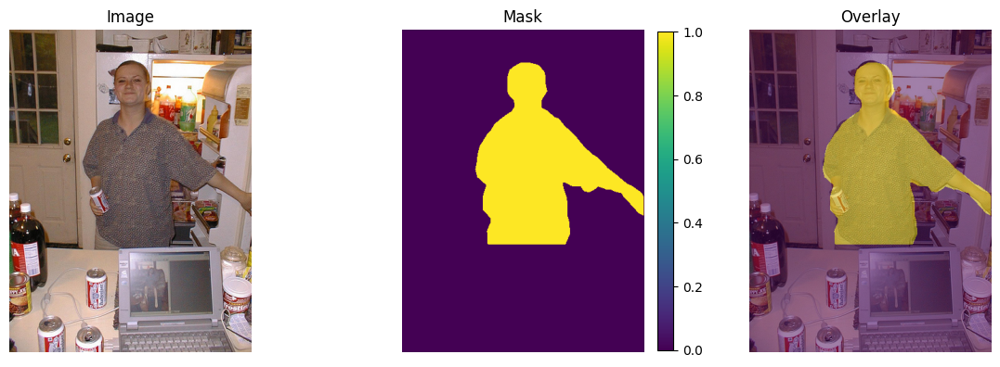

In [13]:
mask_files = list(Path(MASK_DIR).glob("*.png"))
print("Num multi-class masks:", len(mask_files))

m_path = random.choice(mask_files)
stem = m_path.stem

# try a few common extensions
img_path = None
for ext in [".jpg", ".jpeg", ".JPG", ".JPEG"]:
    cand = Path(IMG_DIR) / f"{stem}{ext}"
    if cand.exists():
        img_path = cand
        break

if img_path is None:
    raise FileNotFoundError(f"No image found matching mask stem {stem} in {IMG_DIR}")

img = Image.open(img_path).convert("RGB")
mask = np.array(Image.open(m_path))

NUM_CLASSES = len(KEEP_NAMES) + 1   # +1 for background (0)
vmin, vmax = 0, NUM_CLASSES - 1

fig, axs = plt.subplots(1, 3, figsize=(12, 4))

# image
axs[0].imshow(img)
axs[0].set_title("Image")
axs[0].axis("off")

# mask
im = axs[1].imshow(mask, cmap="viridis", vmin=vmin, vmax=vmax)
axs[1].set_title(f"Mask")
axs[1].axis("off")
plt.colorbar(im, ax=axs[1], fraction=0.046, pad=0.04)

# overlay
axs[2].imshow(img)
axs[2].imshow(mask, alpha=0.5, cmap="viridis", vmin=vmin, vmax=vmax)
axs[2].set_title("Overlay")
axs[2].axis("off")

plt.tight_layout()
plt.show()

### Train-Val-Test-Split

In [15]:
import importlib
import dataloaders.coco_dataset
importlib.reload(dataloaders.coco_dataset)

<module 'dataloaders.coco_dataset' from '/content/dataloaders/coco_dataset.py'>

In [14]:
from dataloaders.coco_dataset import COCODataset, coco_image_transform, coco_map_transform, MEAN_RGB, STDDEV_RGB

full_coco = COCODataset(
    root=DATA_DIR,
    train=True,
    image_transform=coco_image_transform,
    map_transform=coco_map_transform,
    train_split=1.0,                 # use 100% of images
)

N = len(full_coco)
train_frac = 0.7
val_frac   = 0.15
test_frac  = 0.15

n_train = int(N * train_frac)
n_val   = int(N * val_frac)
n_test  = N - n_train - n_val        # ensures all samples used

generator = torch.Generator().manual_seed(42)
train_set, val_set, test_set = random_split(
    full_coco,
    [n_train, n_val, n_test],
    generator=generator
)

print(f"Total: {N}, Train: {len(train_set)}, Val: {len(val_set)}, Test: {len(test_set)}")

# 2) DataLoaders
train_loader = DataLoader(
    train_set,
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
)

val_loader = DataLoader(
    val_set,
    batch_size=BATCH_SIZE,
    shuffle=False,
    drop_last=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
)

test_loader = DataLoader(
    test_set,
    batch_size=BATCH_SIZE,
    shuffle=False,
    drop_last=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
)


Train set: 29755 images
Total: 29755, Train: 20828, Val: 4463, Test: 4464


### Visual Sanity Check


Images shape: torch.Size([64, 3, 256, 256]) torch.float32
Masks shape: torch.Size([64, 1, 256, 256]) torch.int64 unique: tensor([0, 1])


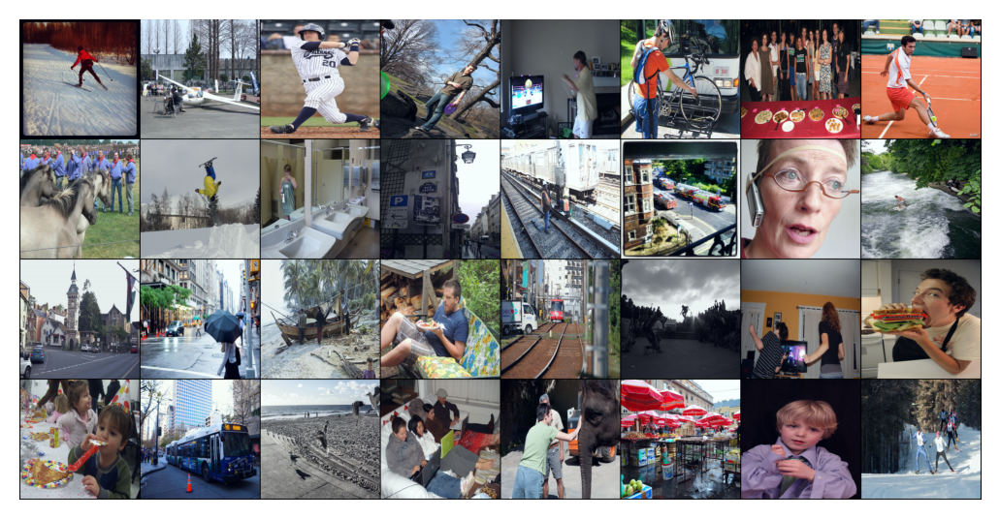

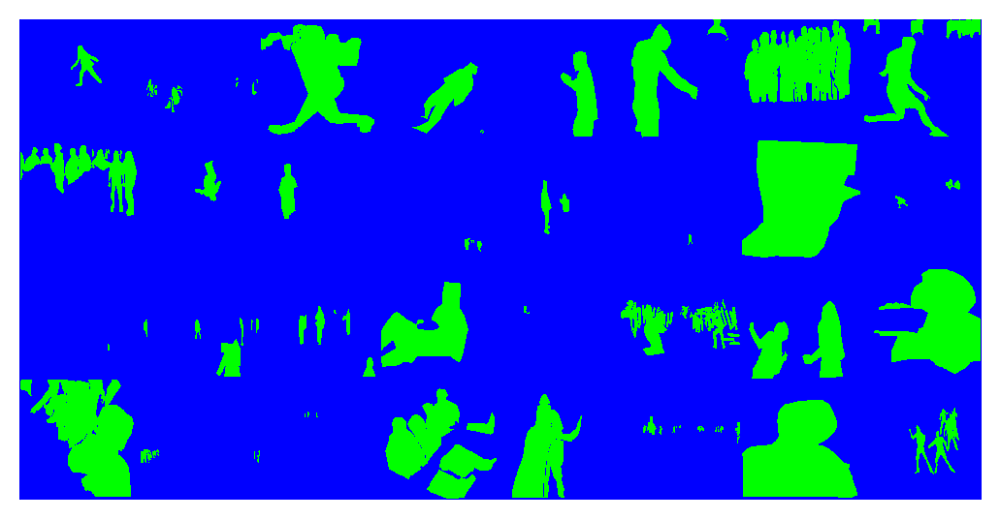

In [15]:
def show_batch(images, maps, out=None, max_images=32):
    """
    images: [B,3,H,W]
    maps:   [B,1,H,W] or [B,H,W]
    out:    optional prediction tensor, same batch size as maps
    max_images: int or None. If set, only the first max_images from the batch are shown.
    """
    plt.rcParams['figure.dpi'] = 200

    # Decide how many images to show
    B = images.size(0)
    if max_images is None:
        max_images = B
    max_images = min(max_images, B)

    images_vis = images[:max_images]
    maps_vis   = maps[:max_images]
    out_vis    = out[:max_images] if out is not None else None

    # ---- RGB images ----
    g = torchvision.utils.make_grid(images_vis, normalize=True)
    plt.imshow(g.permute(1, 2, 0).detach().cpu())
    plt.axis("off")

    # ---- predictions (if provided) ----
    if out_vis is not None:
        plt.figure()
        # if out is [B,H,W], add channel dim for make_grid
        if out_vis.dim() == 3:
            out_vis_grid = out_vis.unsqueeze(1).float()
        else:
            out_vis_grid = out_vis.float()

        g = torchvision.utils.make_grid(out_vis_grid)
        plt.imshow(
            g[0:1].permute(1, 2, 0).detach().cpu(),
            interpolation='nearest',
            cmap="brg"
        )
        plt.axis("off")

    # ---- ground truth maps ----
    plt.figure()
    # maps is [B,1,H,W] or [B,H,W] → make it [B,1,H,W]
    if maps_vis.dim() == 3:
        maps_vis_grid = maps_vis.unsqueeze(1).float()
    else:
        maps_vis_grid = maps_vis.float()

    g = torchvision.utils.make_grid(maps_vis_grid)
    plt.imshow(
        g[0:1].permute(1, 2, 0).detach().cpu(),
        interpolation='nearest',
        cmap="brg"
    )
    plt.axis("off")
    plt.show()

images, maps = next(iter(train_loader))
print("\nImages shape:", images.shape, images.dtype)
print("Masks shape:", maps.shape, maps.dtype, "unique:", maps.unique())
show_batch(images, maps, max_images=32)

## Train U-Net baseline

### Model Initialization

In [16]:
from models.unet import UNet

baseline_model = UNet(in_channels=3, num_classes=CLASSES).to(DEVICE)
print(baseline_model)

UNet(
  (down_convolution_1): DownSample(
    (conv): DoubleConv(
      (conv_op): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
    )
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down_convolution_2): DownSample(
    (conv): DoubleConv(
      (conv_op): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
    )
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down_convolution_3): DownSample(
    (conv): DoubleConv(
      (conv_op): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), paddin

### Parameters

In [17]:
optimizer_unet = torch.optim.Adam(baseline_model.parameters(), LEARNING_RATE)

total_params = 0
for p in baseline_model.parameters():
    total_params += p.numel()
print(f"{total_params / 1e6:.2f}M parameters")

31.03M parameters


### Training

In [18]:
train_losses, val_losses = [], []
train_accs, val_accs = [], []

best_val_loss = float("inf")

for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")

    # ===== TRAIN =====
    baseline_model.train()
    running_loss = 0.0
    running_acc = 0.0

    pbar = tqdm(train_loader, desc=f"Train {epoch+1}", leave=False)
    for images, labels in pbar:
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer_unet.zero_grad()
        logits = baseline_model(images)

        loss = torch.nn.functional.cross_entropy(logits, labels.squeeze(1))
        loss.backward()
        optimizer_unet.step()

        running_loss += loss.item()

        with torch.no_grad():
            preds = logits.argmax(1)
            acc = (preds == labels.squeeze(1)).float().mean().item() * 100
            running_acc += acc

        pbar.set_postfix({"loss": f"{loss.item():.4f}", "acc": f"{acc:.1f}%"})

    epoch_train_loss = running_loss / len(train_loader)
    epoch_train_acc = running_acc / len(train_loader)

    train_losses.append(epoch_train_loss)
    train_accs.append(epoch_train_acc)

    # ===== VALIDATION =====
    baseline_model.eval()
    val_loss = 0.0
    val_acc = 0.0

    pbar_val = tqdm(val_loader, desc=f"Val   {epoch+1}", leave=False)
    with torch.no_grad():
        for images, labels in pbar_val:
            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            logits = baseline_model(images)
            loss = torch.nn.functional.cross_entropy(logits, labels.squeeze(1))

            val_loss += loss.item()
            preds = logits.argmax(1)
            acc = (preds == labels.squeeze(1)).float().mean().item() * 100
            val_acc += acc

            pbar_val.set_postfix({"loss": f"{loss.item():.4f}", "acc": f"{acc:.1f}%"})

    epoch_val_loss = val_loss / len(val_loader)
    epoch_val_acc = val_acc / len(val_loader)

    val_losses.append(epoch_val_loss)
    val_accs.append(epoch_val_acc)

    # ===== SUMMARY PRINT =====
    print(
        f"Epoch {epoch+1}: "
        f"train_loss={epoch_train_loss:.4f}, val_loss={epoch_val_loss:.4f}, "
        f"train_acc={epoch_train_acc:.1f}%, val_acc={epoch_val_acc:.1f}%"
    )

    # ===== SAVE BEST MODEL ONLY =====
    state = {
        "epoch": epoch + 1,
        "net": baseline_model.state_dict(),
        "optimizer": optimizer_unet.state_dict(),
        "val_loss": epoch_val_loss,
    }

    # Save last model always
    torch.save(state, os.path.join(MODEL_RESULTS_DIR, "unet_last.pt"))

    # Save best by validation loss
    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        torch.save(state, os.path.join(MODEL_RESULTS_DIR, "unet_best.pt"))
        print(f"New best model saved (val_loss={best_val_loss:.4f})")


Epoch 1/20


Epoch 1: train_loss=0.3976, val_loss=0.3807, train_acc=83.2%, val_acc=83.4%
New best model saved (val_loss=0.3807)

Epoch 2/20


Epoch 2: train_loss=0.3500, val_loss=0.3291, train_acc=84.7%, val_acc=85.5%
New best model saved (val_loss=0.3291)

Epoch 3/20


Epoch 3: train_loss=0.3246, val_loss=0.3158, train_acc=85.8%, val_acc=86.1%
New best model saved (val_loss=0.3158)

Epoch 4/20


Epoch 4: train_loss=0.3097, val_loss=0.3035, train_acc=86.4%, val_acc=86.6%
New best model saved (val_loss=0.3035)

Epoch 5/20


Epoch 5: train_loss=0.3035, val_loss=0.3044, train_acc=86.7%, val_acc=86.6%

Epoch 6/20


Epoch 6: train_loss=0.2960, val_loss=0.2944, train_acc=87.0%, val_acc=87.0%
New best model saved (val_loss=0.2944)

Epoch 7/20


Epoch 7: train_loss=0.2881, val_loss=0.2894, train_acc=87.3%, val_acc=87.3%
New best model saved (val_loss=0.2894)

Epoch 8/20


Epoch 8: train_loss=0.2845, val_loss=0.2842, train_acc=87.5%, val_acc=87.4%
New best model saved (val_loss=0.2842)

Epoch 9/20


Epoch 9: train_loss=0.2786, val_loss=0.2803, train_acc=87.8%, val_acc=87.8%
New best model saved (val_loss=0.2803)

Epoch 10/20


Epoch 10: train_loss=0.2766, val_loss=0.2752, train_acc=87.9%, val_acc=87.9%
New best model saved (val_loss=0.2752)

Epoch 11/20


Epoch 11: train_loss=0.2713, val_loss=0.2745, train_acc=88.2%, val_acc=87.9%
New best model saved (val_loss=0.2745)

Epoch 12/20


Epoch 12: train_loss=0.2682, val_loss=0.2775, train_acc=88.3%, val_acc=87.9%

Epoch 13/20


Epoch 13: train_loss=0.2656, val_loss=0.2704, train_acc=88.4%, val_acc=88.2%
New best model saved (val_loss=0.2704)

Epoch 14/20


Epoch 14: train_loss=0.2639, val_loss=0.2718, train_acc=88.5%, val_acc=88.2%

Epoch 15/20


Epoch 15: train_loss=0.2606, val_loss=0.2676, train_acc=88.7%, val_acc=88.5%
New best model saved (val_loss=0.2676)

Epoch 16/20


Epoch 16: train_loss=0.2588, val_loss=0.2609, train_acc=88.8%, val_acc=88.6%
New best model saved (val_loss=0.2609)

Epoch 17/20


Epoch 17: train_loss=0.2583, val_loss=0.2596, train_acc=88.8%, val_acc=88.7%
New best model saved (val_loss=0.2596)

Epoch 18/20


Epoch 18: train_loss=0.2550, val_loss=0.2589, train_acc=88.9%, val_acc=88.7%
New best model saved (val_loss=0.2589)

Epoch 19/20


Epoch 19: train_loss=0.2558, val_loss=0.2589, train_acc=88.9%, val_acc=88.8%

Epoch 20/20


Epoch 20: train_loss=0.2535, val_loss=0.2647, train_acc=89.0%, val_acc=88.5%


### Plotting losses

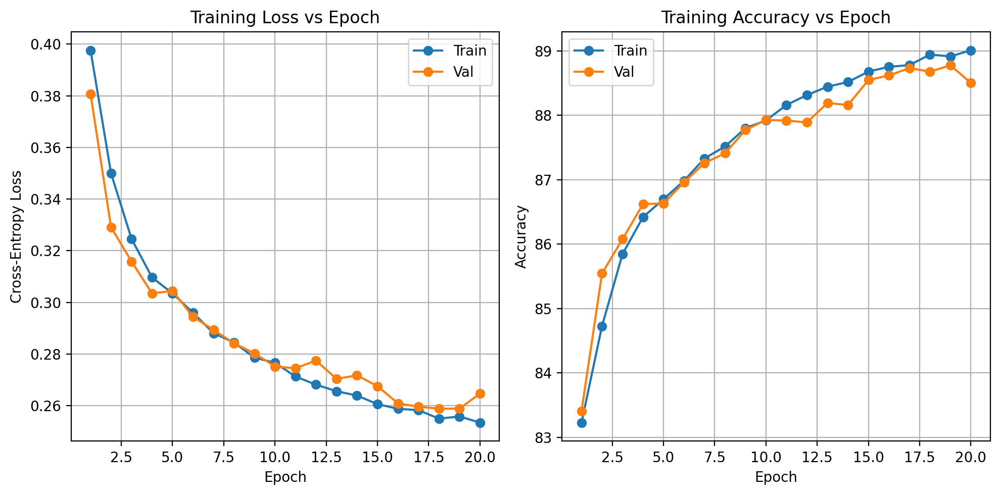

In [19]:
epochs = range(1, NUM_EPOCHS + 1)
sync_drive(False)

fig, ax = plt.subplots(1,2, figsize=(10,5))
# Loss
ax[0].plot(epochs, train_losses, marker='o')
ax[0].plot(epochs, val_losses, marker='o')
ax[0].legend(["Train", "Val"])
ax[0].set_xlabel("Epoch")
ax[0].set_ylabel("Cross-Entropy Loss")
ax[0].set_title("Training Loss vs Epoch")
ax[0].grid(True)

# Accuracy
ax[1].plot(epochs, train_accs, marker='o')
ax[1].plot(epochs, val_accs, marker='o')
ax[1].legend(["Train", "Val"])
ax[1].set_xlabel("Epoch")
ax[1].set_ylabel("Accuracy")
ax[1].set_title("Training Accuracy vs Epoch")
ax[1].grid(True)

plt.tight_layout()
plt.show()

### Evaluation

In [20]:
from utils.metrics import boundary_f1_score, boundary_f1_single

@torch.no_grad()
def evaluate_baseline_on_test(model, loader, num_classes, device=DEVICE):
    model.eval()
    confusion = torch.zeros(num_classes ** 2, dtype=torch.int64)

    for images, labels in tqdm(loader, desc="Testing (Baseline)"):
        images = images.to(device)
        labels = labels.to(device).squeeze(1)   # (B,H,W)

        logits = model(images)                  # (B,C,H,W)
        preds = logits.argmax(1)                # (B,H,W)

        entries = preds * num_classes + labels
        counts = torch.bincount(entries.view(-1), minlength=num_classes ** 2)
        confusion += counts.cpu()

    confusion = confusion.view(num_classes, num_classes)

    # Accuracy
    acc = 100.0 * confusion.diag().sum().float() / confusion.sum().float()

    # boundary F1
    bf1 = boundary_f1_score(model, loader, num_classes, device,
                        tolerance=2, ignore_background=True)

    # IoU per class + mIoU
    eps = 1e-6
    intersection = confusion.diag().float()
    union = confusion.sum(0).float() + confusion.sum(1).float() - intersection
    iou = (intersection / (union + eps)).tolist()
    miou = sum(iou) / len(iou)

    print("\n" + "=" * 60)
    print("BASELINE U-NET EVALUATION (test set)")
    print("=" * 60)
    print(f"Accuracy: {acc:.2f}%")
    print(f"IoU per class: {iou}")
    print(f"mIoU: {miou:.4f}")
    print(f"Boundary F1 (mean over classes, tol=2 px): {bf1:.4f}")
    print("=" * 60)

    return confusion, acc.item(), iou, miou, bf1

In [21]:
data_unet = torch.load(os.path.join(MODEL_RESULTS_DIR, "unet_best.pt"), map_location=DEVICE)
baseline_model.load_state_dict(data_unet["net"])
baseline_model.eval()

conf_base, acc_base, iou_base, miou_base, bf1_base = evaluate_baseline_on_test(baseline_model, test_loader, CLASSES)

Testing (Baseline): 100%|██████████| 70/70 [00:20<00:00,  3.44it/s]



BASELINE U-NET EVALUATION (test set)
Accuracy: 88.68%
IoU per class: [0.8747485280036926, 0.46050646901130676]
mIoU: 0.6676
Boundary F1 (mean over classes, tol=2 px): 0.3725


### Visualizing Predictions

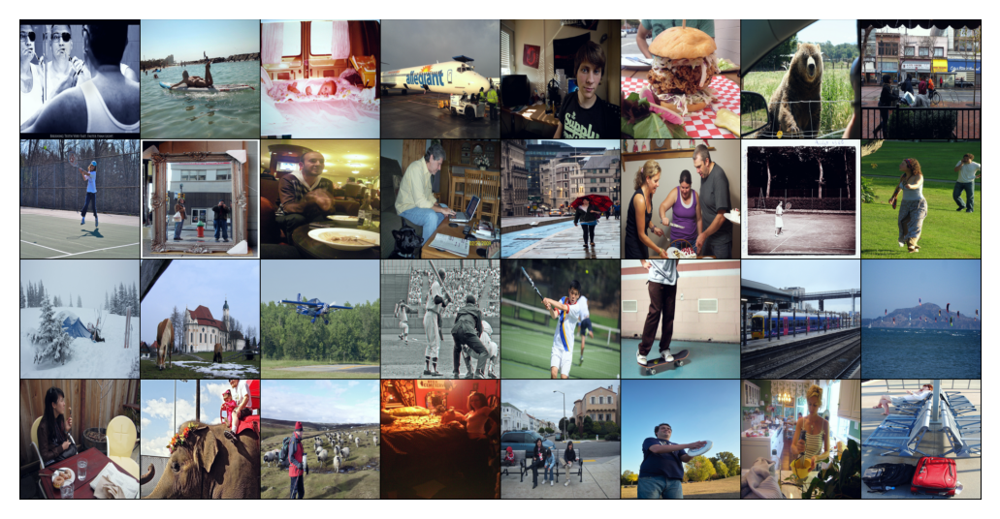

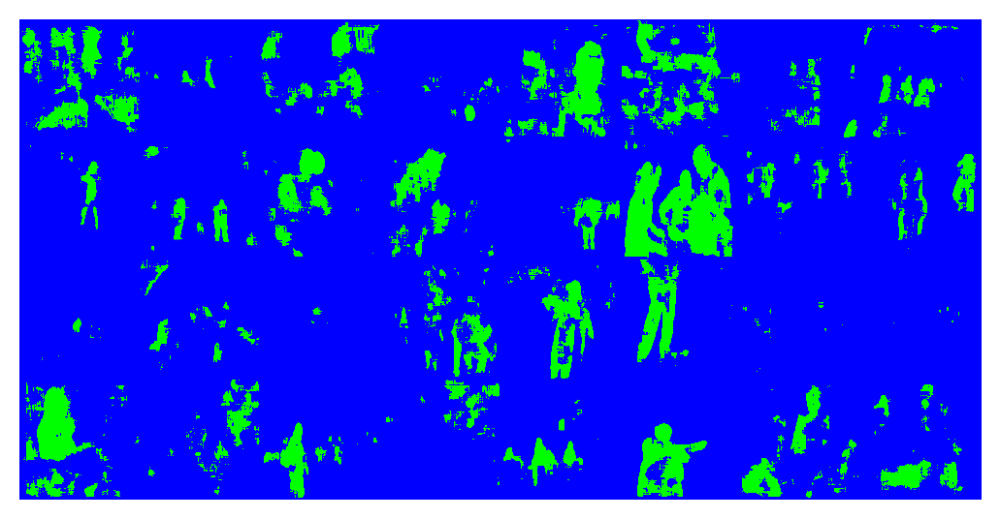

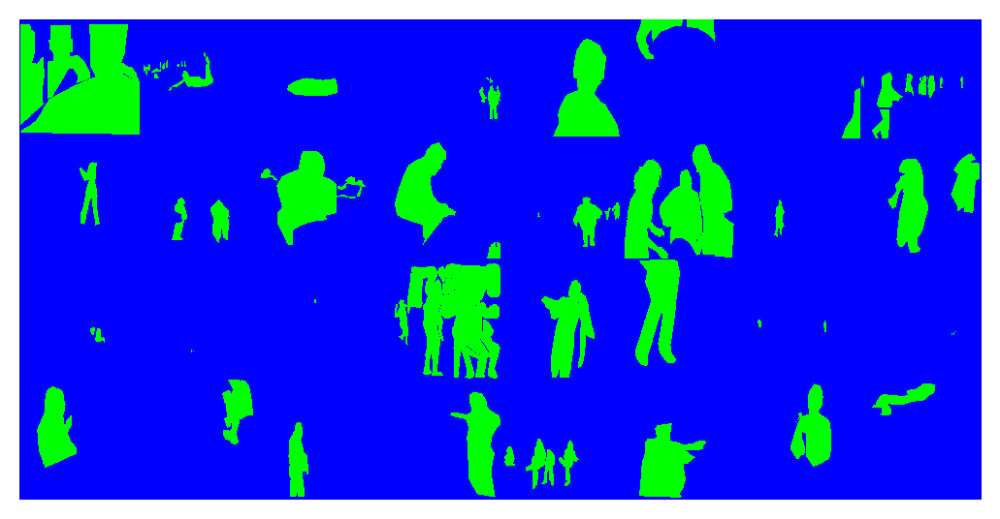

In [22]:
images, maps = next(iter(test_loader))
out = baseline_model(images.to(DEVICE)).argmax(1, True).to("cpu")
show_batch(images, maps, out)

## Residual Diffusion Refiner

### Model Initialization

In [23]:
from models.diffusion_refiner import DiffusionUNet, batch_mean_iou, q_sample, build_diffusion_input, T

# in_channels = C (x_t) + 1 (t) + C (probs) + C (logits) + 3 (RGB) = 3C + 4
diff_in_channels = 3 * CLASSES + 4
diff_out_channels = CLASSES  # residual over logits per class

diffusion_model = DiffusionUNet(
    in_channels=diff_in_channels,
    out_channels=diff_out_channels,
    base_channels=32,
    depth=3
).to(DEVICE)

### Model Parameters

In [24]:
total_params = 0
for p in diffusion_model.parameters():
    total_params += p.numel()
print(f"{total_params / 1e6:.2f}M parameters")

0.84M parameters


### Training

In [25]:
# Training config
EPOCHS_DIFF = NUM_EPOCHS
LR_DIFF = 5e-4
optimizer_diff = torch.optim.Adam(diffusion_model.parameters(), lr=LR_DIFF)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer_diff, step_size=4, gamma=0.5)

best_val_loss_diff = float("inf")

In [26]:
def train_diffusion_epoch(model, baseline_model, loader, optimizer, device, num_classes):
    model.train()
    baseline_model.eval()
    total_loss = 0.0
    total_miou = 0.0

    pbar = tqdm(loader, desc="Diffusion Train", leave=False)
    for images, labels in pbar:
        images = images.to(device)             # (B,3,H,W)
        labels = labels.to(device).squeeze(1)  # (B,H,W) long

        # 1) baseline logits + probabilities (our "clean" x0)
        with torch.no_grad():
            logits_base = baseline_model(images)          # (B,C,H,W)
            base_probs = F.softmax(logits_base, dim=1)    # (B,C,H,W)

        # 2) sample timestep t ∈ [0, T]
        B = labels.size(0)
        t = torch.randint(0, T + 1, (B,), device=device).long()

        # 3) forward noising of baseline probs
        x_t = q_sample(base_probs, t)                     # (B,C,H,W)

        # 4) build input: noisy baseline + t + baseline probs + logits + image
        x_in = build_diffusion_input(x_t, t, base_probs, logits_base, images)

        # 5) predict residual logits
        delta_logits = model(x_in)                        # (B,C,H,W)

        # 6) refined logits = baseline logits + residual
        refined_logits = logits_base + delta_logits

        # 7) loss vs ground truth labels (cross-entropy)
        loss = F.cross_entropy(refined_logits, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        # quick mIoU for monitoring
        preds_classes = refined_logits.argmax(1)          # (B,H,W)
        batch_miou = batch_mean_iou(preds_classes, labels, num_classes)
        total_miou += batch_miou

        pbar.set_postfix(loss=f"{loss.item():.4f}", mIoU=f"{batch_miou:.3f}")

    avg_loss = total_loss / len(loader)
    avg_miou = total_miou / len(loader)
    return avg_loss, avg_miou


@torch.no_grad()
def validate_diffusion_epoch(model, baseline_model, loader, device, num_classes):
    model.eval()
    baseline_model.eval()
    total_loss = 0.0
    total_miou = 0.0

    pbar = tqdm(loader, desc="Diffusion Validation", leave=False)
    for images, labels in pbar:
        images = images.to(device)
        labels = labels.to(device).squeeze(1)   # (B,H,W)

        logits_base = baseline_model(images)
        base_probs = F.softmax(logits_base, dim=1)

        B = labels.size(0)
        t = torch.randint(0, T + 1, (B,), device=device).long()

        x_t = q_sample(base_probs, t)
        x_in = build_diffusion_input(x_t, t, base_probs, logits_base, images)
        delta_logits = model(x_in)
        refined_logits = logits_base + delta_logits

        loss = F.cross_entropy(refined_logits, labels)
        total_loss += loss.item()

        preds_classes = refined_logits.argmax(1)
        batch_miou = batch_mean_iou(preds_classes, labels, num_classes)
        total_miou += batch_miou

    avg_loss = total_loss / len(loader)
    avg_miou = total_miou / len(loader)
    return avg_loss, avg_miou

In [27]:
diffusion_train_losses, diffusion_val_losses = [], []
diffusion_train_mious, diffusion_val_mious = [], []

for epoch in range(1, EPOCHS_DIFF + 1):
    print(f"\n=== Residual Diffusion Refiner Epoch {epoch}/{EPOCHS_DIFF} ===")
    train_loss, train_miou = train_diffusion_epoch(
        diffusion_model, baseline_model, train_loader, optimizer_diff, DEVICE, CLASSES
    )

    diffusion_train_losses.append(train_loss)
    diffusion_train_mious.append(train_miou)

    val_loss, val_miou = validate_diffusion_epoch(
        diffusion_model, baseline_model, val_loader, DEVICE, CLASSES
    )

    diffusion_val_losses.append(val_loss)
    diffusion_val_mious.append(val_miou)

    print(f"Train: loss={train_loss:.4f}, mIoU={train_miou:.4f}")
    print(f"Val:   loss={val_loss:.4f}, mIoU={val_miou:.4f}")

    # save "last" diffusion model
    diff_state = {
        "epoch": epoch,
        "net": diffusion_model.state_dict(),
        "optimizer": optimizer_diff.state_dict(),
        "val_loss": val_loss,
        "val_mIoU": val_miou,
    }
    torch.save(diff_state, os.path.join(MODEL_RESULTS_DIR, "diffusion_last.pt"))

    # save "best" diffusion model (by lowest val_loss)
    if val_loss < best_val_loss_diff:
        best_val_loss_diff = val_loss
        torch.save(diff_state, os.path.join(MODEL_RESULTS_DIR, "diffusion_best.pt"))
        print(f"New best diffusion model saved (val_loss={best_val_loss_diff:.4f})")

    scheduler.step()


=== Residual Diffusion Refiner Epoch 1/20 ===


Train: loss=0.2153, mIoU=0.7150
Val:   loss=0.2123, mIoU=0.7185
New best diffusion model saved (val_loss=0.2123)

=== Residual Diffusion Refiner Epoch 2/20 ===


Train: loss=0.2020, mIoU=0.7320
Val:   loss=0.2045, mIoU=0.7324
New best diffusion model saved (val_loss=0.2045)

=== Residual Diffusion Refiner Epoch 3/20 ===


Train: loss=0.1947, mIoU=0.7416
Val:   loss=0.2209, mIoU=0.7351

=== Residual Diffusion Refiner Epoch 4/20 ===


Train: loss=0.1906, mIoU=0.7464
Val:   loss=0.1940, mIoU=0.7444
New best diffusion model saved (val_loss=0.1940)

=== Residual Diffusion Refiner Epoch 5/20 ===


Train: loss=0.1830, mIoU=0.7559
Val:   loss=0.1894, mIoU=0.7466
New best diffusion model saved (val_loss=0.1894)

=== Residual Diffusion Refiner Epoch 6/20 ===


Train: loss=0.1801, mIoU=0.7603
Val:   loss=0.1878, mIoU=0.7533
New best diffusion model saved (val_loss=0.1878)

=== Residual Diffusion Refiner Epoch 7/20 ===


Train: loss=0.1778, mIoU=0.7635
Val:   loss=0.1877, mIoU=0.7535
New best diffusion model saved (val_loss=0.1877)

=== Residual Diffusion Refiner Epoch 8/20 ===


Train: loss=0.1757, mIoU=0.7658
Val:   loss=0.1849, mIoU=0.7570
New best diffusion model saved (val_loss=0.1849)

=== Residual Diffusion Refiner Epoch 9/20 ===


Train: loss=0.1703, mIoU=0.7726
Val:   loss=0.1796, mIoU=0.7602
New best diffusion model saved (val_loss=0.1796)

=== Residual Diffusion Refiner Epoch 10/20 ===


Train: loss=0.1682, mIoU=0.7756
Val:   loss=0.1778, mIoU=0.7695
New best diffusion model saved (val_loss=0.1778)

=== Residual Diffusion Refiner Epoch 11/20 ===


Train: loss=0.1669, mIoU=0.7772
Val:   loss=0.1773, mIoU=0.7680
New best diffusion model saved (val_loss=0.1773)

=== Residual Diffusion Refiner Epoch 12/20 ===


Train: loss=0.1646, mIoU=0.7800
Val:   loss=0.1782, mIoU=0.7700

=== Residual Diffusion Refiner Epoch 13/20 ===


Train: loss=0.1614, mIoU=0.7841
Val:   loss=0.1764, mIoU=0.7698
New best diffusion model saved (val_loss=0.1764)

=== Residual Diffusion Refiner Epoch 14/20 ===


Train: loss=0.1599, mIoU=0.7860
Val:   loss=0.1755, mIoU=0.7700
New best diffusion model saved (val_loss=0.1755)

=== Residual Diffusion Refiner Epoch 15/20 ===


Train: loss=0.1589, mIoU=0.7871
Val:   loss=0.1767, mIoU=0.7727

=== Residual Diffusion Refiner Epoch 16/20 ===


Train: loss=0.1579, mIoU=0.7889
Val:   loss=0.1758, mIoU=0.7710

=== Residual Diffusion Refiner Epoch 17/20 ===


Train: loss=0.1557, mIoU=0.7913
Val:   loss=0.1747, mIoU=0.7721
New best diffusion model saved (val_loss=0.1747)

=== Residual Diffusion Refiner Epoch 18/20 ===


Train: loss=0.1545, mIoU=0.7933
Val:   loss=0.1750, mIoU=0.7729

=== Residual Diffusion Refiner Epoch 19/20 ===


Train: loss=0.1543, mIoU=0.7934
Val:   loss=0.1755, mIoU=0.7706

=== Residual Diffusion Refiner Epoch 20/20 ===


Train: loss=0.1533, mIoU=0.7948
Val:   loss=0.1764, mIoU=0.7749


### Plotting losses

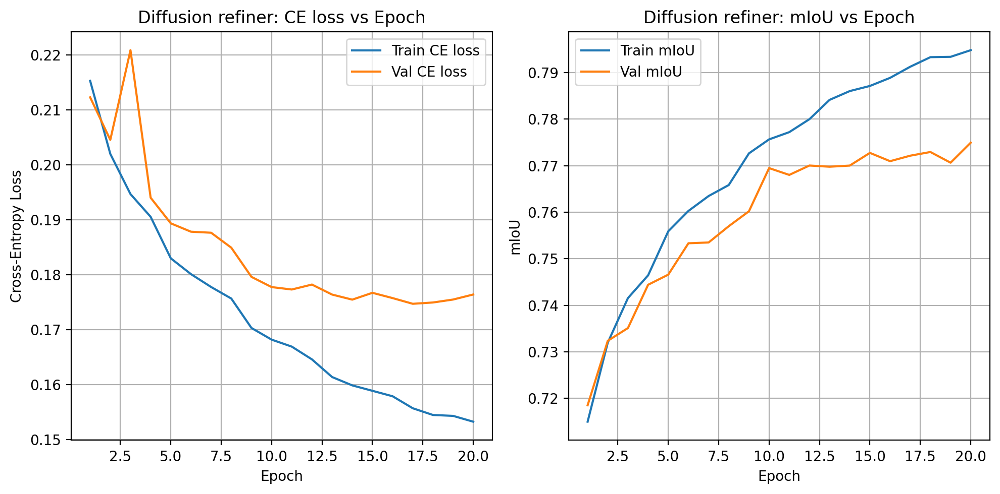

In [28]:
epochs = range(1, EPOCHS_DIFF + 1)
sync_drive(False)

fig, ax = plt.subplots(1,2, figsize=(10,5))
# Loss
ax[0].plot(epochs, diffusion_train_losses, label="Train CE loss")
ax[0].plot(epochs, diffusion_val_losses,   label="Val CE loss")
ax[0].set_xlabel("Epoch")
ax[0].set_ylabel("Cross-Entropy Loss")
ax[0].set_title("Diffusion refiner: CE loss vs Epoch")
ax[0].legend()
ax[0].grid(True)

# Accuracy
ax[1].plot(epochs, diffusion_train_mious, label="Train mIoU")
ax[1].plot(epochs, diffusion_val_mious, label="Val mIoU")
ax[1].set_xlabel("Epoch")
ax[1].set_ylabel("mIoU")
ax[1].set_title("Diffusion refiner: mIoU vs Epoch")
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()

# Save both plots in the same image
# plt.savefig(os.path.join(PROJECT_DIR, f"r_classes{CLASSES}_diff_ref_T{T}_epoch{EPOCHS_DIFF}_loss_mIoU.png"), dpi=200)

plt.show()

### Evaluation

In [29]:
data_diffusion = torch.load(os.path.join(MODEL_RESULTS_DIR, "diffusion_best.pt"), map_location=DEVICE)
diffusion_model.load_state_dict(data_diffusion["net"])
diffusion_model.eval()

DiffusionUNet(
  (encoder): ModuleList(
    (0): DiffConvBlock(
      (down): Identity()
      (conv1): Conv2d(10, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (up): Identity()
    )
    (1): DiffConvBlock(
      (down): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (up): Identity()
    )
    (2): DiffConvBlock(
      (down): MaxPoo

In [30]:
@torch.no_grad()
def refine_with_diffusion(diffusion_model, baseline_model, images, t_start=0):
    """
    images: (B,3,H,W)
    t_start: integer in [0, T]; 0 = no noise, >0 = add diffusion noise
    returns:
        base_logits:   baseline logits (B,C,H,W)
        refined_probs: diffusion-refined probabilities (B,C,H,W)
    """
    baseline_model.eval()
    diffusion_model.eval()

    images = images.to(DEVICE)
    logits_base = baseline_model(images)                 # (B,C,H,W)
    probs_base = F.softmax(logits_base, dim=1)           # (B,C,H,W)

    B = images.size(0)
    t_start = max(0, min(T, int(t_start)))
    t = torch.full((B,), t_start, device=DEVICE, dtype=torch.long)

    # baseline probs as "clean" x0 → possibly noised
    x_t = q_sample(probs_base, t)                        # (B,C,H,W)
    x_in = build_diffusion_input(x_t, t, probs_base, logits_base, images)
    delta_logits = diffusion_model(x_in)                 # (B,C,H,W)

    refined_logits = logits_base + delta_logits
    refined_probs = F.softmax(refined_logits, dim=1)
    return logits_base, refined_probs

@torch.no_grad()
def boundary_f1_score_diffusion(
    diffusion_model,
    baseline_model,
    loader,
    num_classes,
    device,
    t_start=0,
    tolerance=2,
    ignore_background=True,
):
    """
    Mean boundary F1 over all images in loader,
    using the diffusion refiner at a fixed t_start.
    """
    diffusion_model.eval()
    baseline_model.eval()

    total_f1 = 0.0
    count = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device).squeeze(1)  # (B,H,W)

        # get refined probabilities from your diffusion pipeline
        _, refined_probs = refine_with_diffusion(
            diffusion_model, baseline_model, images, t_start=t_start
        )
        preds = refined_probs.argmax(1)        # (B,H,W)

        for b in range(images.size(0)):
            f1 = boundary_f1_single(
                labels[b],
                preds[b],
                num_classes=num_classes,
                tolerance=tolerance,
                ignore_background=ignore_background,
            )
            total_f1 += f1
            count += 1

    return total_f1 / max(count, 1)

@torch.no_grad()
def evaluate_diffusion_on_test(diffusion_model, baseline_model, loader, t_start, num_classes):
    diffusion_model.eval()
    baseline_model.eval()

    confusion = torch.zeros(num_classes ** 2, dtype=torch.int64)

    for images, labels in tqdm(loader, desc=f"Testing (Diffusion, t_start={t_start})"):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE).squeeze(1)     # (B,H,W)

        _, refined_probs = refine_with_diffusion(diffusion_model, baseline_model, images, t_start)
        preds = refined_probs.argmax(1)           # (B,H,W)

        entries = preds * num_classes + labels
        counts = torch.bincount(entries.view(-1), minlength=num_classes ** 2)
        confusion += counts.cpu()

    confusion = confusion.view(num_classes, num_classes)
    acc = 100.0 * confusion.diag().sum().float() / confusion.sum().float()

    bf1_diff = boundary_f1_score_diffusion(
        diffusion_model,   # diffusion head
        baseline_model,             # baseline U-Net (or baseline_model if that's what you used)
        loader,
        num_classes=num_classes,   # or CLASSES if you defined that
        device=DEVICE,
        t_start=t_start,
        tolerance=2,
        ignore_background=True,
    )

    intersection = confusion.diag().float()
    union = confusion.sum(0).float() + confusion.sum(1).float() - intersection
    eps = 1e-6
    iou = (intersection / (union + eps)).tolist()
    miou = sum(iou) / len(iou)

    return confusion, acc.item(), iou, miou, bf1_diff

A small sweep over `t_start` gauges how much noise to inject before refinement.

`refine_with_diffusion` rebuilds probabilities, and the loop reports accuracy/IoU for each candidate before picking the best. Boundary F1 gets recomputed to compare the refiner against the baseline UNet.

In [45]:
# Try several t_start values and pick the best by mIoU
t_candidates = [2, 5, 10, 15, 20]
results = {}

for t_start in t_candidates:
    conf_d, acc_d, iou_d, miou_d, bf1_d = evaluate_diffusion_on_test(
        diffusion_model, baseline_model, test_loader, t_start=t_start, num_classes=CLASSES
    )
    results[t_start] = (conf_d, acc_d, iou_d, miou_d, bf1_d)
    print(f"t_start={t_start:2d} -> acc={acc_d:.2f}%, mIoU={miou_d:.4f}, bF1={bf1_d:.4f}")

# choose best
best_t = max(results.keys(), key=lambda t: results[t][3])
best_conf, best_acc, best_iou, best_miou, best_bf1 = results[best_t]

print("\n" + "=" * 60)
print(f"BEST RESIDUAL DIFFUSION HEAD (test set) across t_start candidates")
print("=" * 60)
print(f"Best t_start: {best_t}")
print(f"Accuracy: {best_acc:.2f}%")
print(f"IoU per class: {best_iou}")
print(f"mIoU: {best_miou:.4f}")
print(f"Boundary F1 (mean over classes, tol=2 px): {best_bf1:.4f}")
print("=" * 60)

Testing (Diffusion, t_start=2): 100%|██████████| 70/70 [00:20<00:00,  3.40it/s]


t_start= 2 -> acc=92.75%, mIoU=0.7725, bF1=0.4858


Testing (Diffusion, t_start=5): 100%|██████████| 70/70 [00:20<00:00,  3.39it/s]


t_start= 5 -> acc=92.75%, mIoU=0.7723, bF1=0.4858


Testing (Diffusion, t_start=10): 100%|██████████| 70/70 [00:20<00:00,  3.42it/s]


t_start=10 -> acc=92.75%, mIoU=0.7722, bF1=0.4857


Testing (Diffusion, t_start=15): 100%|██████████| 70/70 [00:20<00:00,  3.42it/s]


t_start=15 -> acc=92.75%, mIoU=0.7721, bF1=0.4856


Testing (Diffusion, t_start=20): 100%|██████████| 70/70 [00:20<00:00,  3.36it/s]


t_start=20 -> acc=92.75%, mIoU=0.7722, bF1=0.4855

BEST RESIDUAL DIFFUSION HEAD (test set) across t_start candidates
Best t_start: 2
Accuracy: 92.75%
IoU per class: [0.9173807501792908, 0.6275561451911926]
mIoU: 0.7725
Boundary F1 (mean over classes, tol=2 px): 0.4858


### Visualization: image + GT + baseline + best diffusion

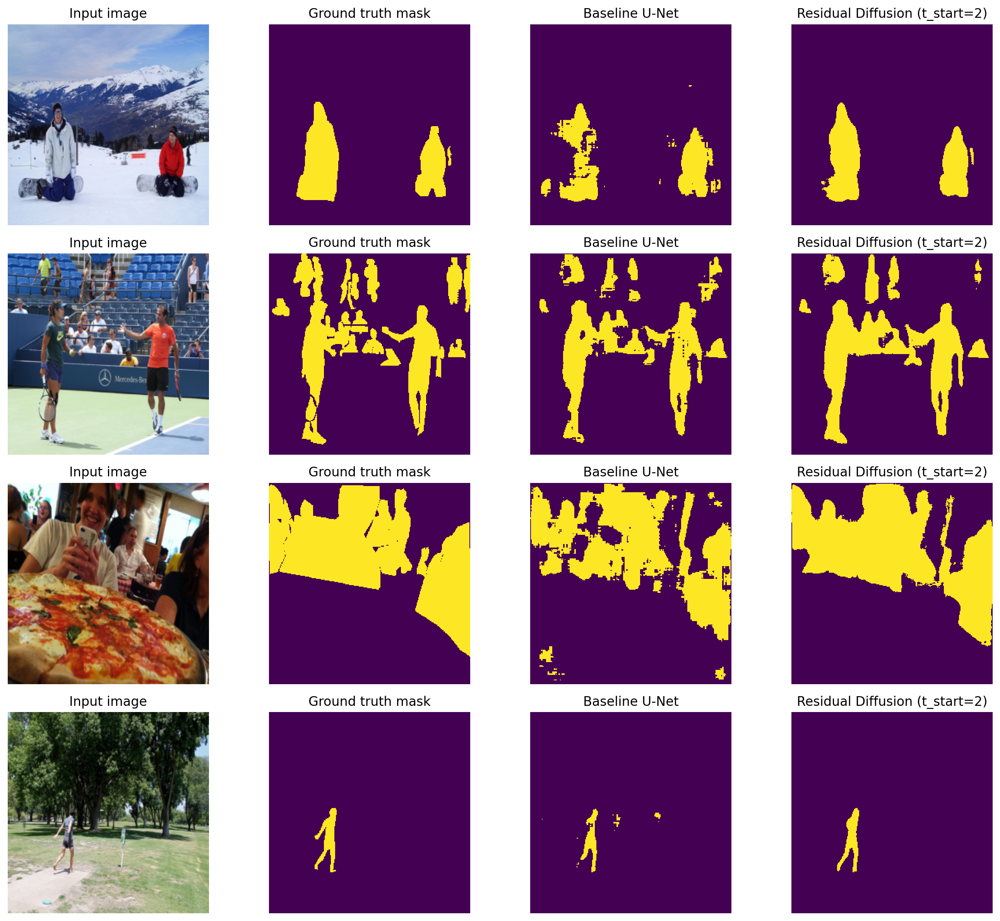

In [32]:
def denormalize_image(tensor):
    """
    tensor: (3,H,W) normalized with MEAN_RGB / STDDEV_RGB
    returns: (3,H,W) in [0,1]
    """
    mean = torch.tensor(MEAN_RGB).view(3, 1, 1)
    std = torch.tensor(STDDEV_RGB).view(3, 1, 1)
    return (tensor * std + mean).clamp(0.0, 1.0)

@torch.no_grad()
def visualize_baseline_vs_diffusion(baseline_model, diffusion_model, loader,
                                    num_samples=4, t_start=0, device=DEVICE):
    """
    Shows: image, GT mask, baseline prediction, diffusion-refined prediction.
    """
    baseline_model.eval()
    diffusion_model.eval()

    # random images
    loader_iter = iter(loader)

    skip = random.randint(0, len(loader)-1)
    for _ in range(skip):
        next(loader_iter)

    images, labels = next(iter(loader_iter))   # images: (B,3,H,W), labels: (B,1,H,W)
    images = images.to(device)
    labels = labels.to(device).squeeze(1)  # (B,H,W)

    logits_base, refined_probs = refine_with_diffusion(
        diffusion_model, baseline_model, images, t_start=t_start
    )

    base_probs = F.softmax(logits_base, dim=1)
    base_preds = base_probs.argmax(1)       # (B,H,W)
    ref_preds = refined_probs.argmax(1)     # (B,H,W)

    images_cpu = images.cpu()
    labels_cpu = labels.cpu()
    base_preds_cpu = base_preds.cpu()
    ref_preds_cpu = ref_preds.cpu()

    num_samples = min(num_samples, images_cpu.size(0))
    fig, axes = plt.subplots(num_samples, 4, figsize=(14, 3 * num_samples))

    if num_samples == 1:
        axes = axes[None, :]

    for i in range(num_samples):
        # 1) input image (denormalized)
        img = denormalize_image(images_cpu[i]).permute(1, 2, 0).numpy()
        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Input image")
        axes[i, 0].axis("off")

        # 2) GT mask
        axes[i, 1].imshow(labels_cpu[i], interpolation="nearest")
        axes[i, 1].set_title("Ground truth mask")
        axes[i, 1].axis("off")

        # 3) baseline prediction
        axes[i, 2].imshow(base_preds_cpu[i], interpolation="nearest")
        axes[i, 2].set_title("Baseline U-Net")
        axes[i, 2].axis("off")

        # 4) diffusion-refined prediction
        axes[i, 3].imshow(ref_preds_cpu[i], interpolation="nearest")
        axes[i, 3].set_title(f"Residual Diffusion (t_start={t_start})")
        axes[i, 3].axis("off")

    plt.tight_layout()
    plt.show()

visualize_baseline_vs_diffusion(
    baseline_model=baseline_model, diffusion_model=diffusion_model, loader=test_loader,
    num_samples=4, t_start=best_t, device=DEVICE
)

### Qualitative Improvements

`visualize_topk_improvements` scans the test set for samples where a single diffusion step improves IoU the most

In [33]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torchvision
import numpy as np
import random

# --- same as before ---
def denormalize_image(tensor):
    """
    tensor: (3,H,W) normalized with MEAN_RGB / STDDEV_RGB
    returns: (3,H,W) in [0,1]
    """
    mean = torch.tensor(MEAN_RGB).view(3, 1, 1)
    std = torch.tensor(STDDEV_RGB).view(3, 1, 1)
    return (tensor * std + mean).clamp(0.0, 1.0)


@torch.no_grad()
def visualize_topk_improvements(
    unet_model,
    diffusion_model,
    loader,
    device,
    t_level=0,      # which timestep to use inside the refiner
    k=5,
    max_search=500,
    foreground_label=1,  # which class index to treat as "foreground"
):
    """
    Find top-k test images where the residual diffusion refiner
    improves foreground IoU the most, and plot them.

    Assumes:
      - q_sample(x0, t) and build_diffusion_input(x_t, t, probs, logits, images)
        are already defined (your simple refiner utilities).
      - Foreground of interest is `foreground_label` (default = 1).
    """

    unet_model.eval()
    diffusion_model.eval()

    results = []
    checked = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device).squeeze(1)  # [B,H,W]

        # ---------- baseline logits ----------
        logits_base = unet_model(images)          # [B,C,H,W]
        preds_base = logits_base.argmax(1)        # [B,H,W]

        # ---------- one-step residual diffusion refinement ----------
        base_probs = F.softmax(logits_base, dim=1)    # [B,C,H,W]

        B = images.size(0)
        t = torch.full((B,), int(t_level), device=device, dtype=torch.long)

        x_t = q_sample(base_probs, t)                 # [B,C,H,W]
        x_in = build_diffusion_input(x_t, t, base_probs, logits_base, images)
        delta_logits = diffusion_model(x_in)          # [B,C,H,W]
        logits_ref = logits_base + delta_logits
        preds_ref = logits_ref.argmax(1)              # [B,H,W]

        # ---------- compute per-image IoU improvements ----------
        for i in range(B):
            if checked >= max_search:
                break

            gt = labels[i]       # (H,W)
            pb = preds_base[i]   # (H,W)
            pr = preds_ref[i]    # (H,W)

            # foreground mask for chosen class
            gt_fg = (gt == foreground_label)
            pb_fg = (pb == foreground_label)
            pr_fg = (pr == foreground_label)

            inter_base = (pb_fg & gt_fg).sum().item()
            union_base = (pb_fg | gt_fg).sum().item()
            iou_base = inter_base / max(union_base, 1)

            inter_ref = (pr_fg & gt_fg).sum().item()
            union_ref = (pr_fg | pr_fg | gt_fg).sum().item()  # small typo fixed below
            # Correct union for ref:
            union_ref = (pr_fg | gt_fg).sum().item()
            iou_ref = inter_ref / max(union_ref, 1)

            gain = iou_ref - iou_base

            results.append({
                "gain": gain,
                "img": images[i].cpu(),
                "gt": gt.cpu(),
                "base": pb.cpu(),
                "ref": pr.cpu(),
                "iou_base": iou_base,
                "iou_ref": iou_ref,
            })

            checked += 1

        if checked >= max_search:
            break

    if len(results) == 0:
        print("No samples processed (maybe no images with this class label?).")
        return

    # sort by gain (descending) and take top-k
    results.sort(key=lambda x: x["gain"], reverse=True)
    topk = results[:k]

    # ------------------- plotting -------------------
    rows = len(topk)
    cols = 4
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 3*rows))

    if rows == 1:
        axes = axes[None, :]  # make it 2D for consistent indexing

    for row, res in enumerate(topk):
        img = res["img"]            # [3,H,W], normalized
        gt = res["gt"]              # [H,W]
        base = res["base"]          # [H,W]
        ref = res["ref"]            # [H,W]

        delta = res["gain"]

        # 1) Input image (denormalized)
        img_denorm = denormalize_image(img).permute(1, 2, 0).numpy()
        axes[row, 0].imshow(img_denorm)
        axes[row, 0].set_title(f"Input (#{row+1})")
        axes[row, 0].axis("off")

        # 2) GT mask
        axes[row, 1].imshow(gt.numpy(), interpolation="nearest")
        axes[row, 1].set_title("Ground truth")
        axes[row, 1].axis("off")

        # 3) Baseline U-Net prediction
        axes[row, 2].imshow(base.numpy(), interpolation="nearest")
        axes[row, 2].set_title(f"Baseline U-Net\nIoU={res['iou_base']:.3f}")
        axes[row, 2].axis("off")

        # 4) Diffusion-refined prediction
        axes[row, 3].imshow(ref.numpy(), interpolation="nearest")
        axes[row, 3].set_title(
            f"Diffusion (1 step, t={t_level})\nIoU={res['iou_ref']:.3f}, Δ={delta:.3f}"
        )
        axes[row, 3].axis("off")

    plt.tight_layout()
    plt.show()

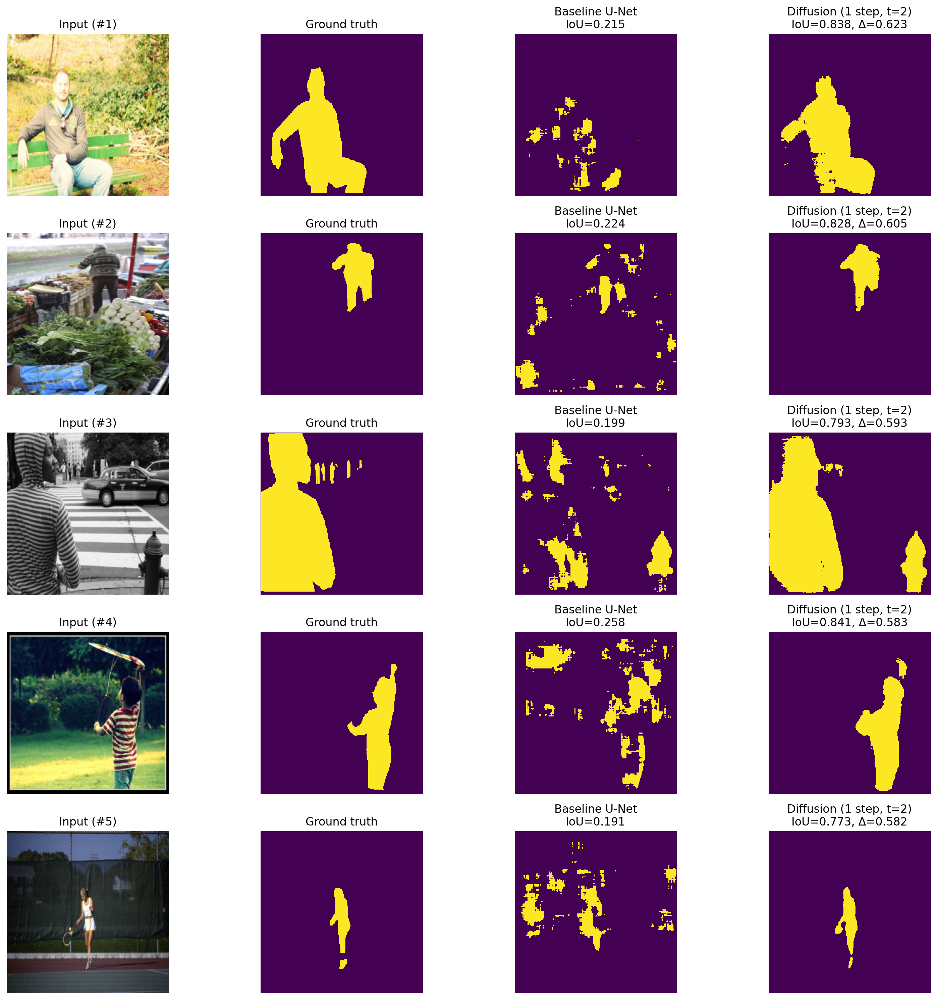

In [37]:
visualize_topk_improvements(
    unet_model=baseline_model,
    diffusion_model=diffusion_model,
    loader=test_loader,
    device=DEVICE,
    t_level=best_t,
    k=5,
    max_search=4000,
)

## Runtime vs Quality (Baseline vs Diffusion Refiner)

In this cell, we evaluate the diffusion head as a **test-time post-processor** on the COCO humans test set.  
We run two kinds of experiments:

1. **Baseline U-Net:**  
   - Single forward pass of the trained U-Net.  
   - We measure runtime per image, pixel accuracy, per-class IoU, mean IoU, and Boundary-F1 (on foreground classes).

2. **Diffusion refiner with few denoising steps:**  
   - We wrap the trained diffusion head around the baseline U-Net and apply it as a post-processing step with a small number of refinement iterations (`num_steps ∈ {1, 2, 3}`) at the best timestep `t = best_t` found in Task 2.  
   - For each setting, we again measure runtime per image, accuracy, per-class IoU, mIoU, and Boundary-F1.

The printed summary at the end compares baseline vs diffusion refiner, showing the trade-off between **additional runtime** and **segmentation quality** for a few denoising steps.

In [38]:
from experiments.diffusion_runtime import (
    refine_with_multiple_steps,
    measure_baseline_runtime_and_quality,
    evaluate_refiner_runtime_quality,
)

# 1) Baseline runtime & quality on test set
baseline_rt, baseline_acc, baseline_iou, baseline_miou, baseline_bf1 = \
    measure_baseline_runtime_and_quality(
        model=baseline_model,
        loader=test_loader,
        num_classes=CLASSES,
        device=DEVICE,
    )

print("\n=== Baseline summary (test set) ===")
print(f"Runtime per image: {baseline_rt:.6f} s")
print(f"Accuracy:          {baseline_acc:.2f}%")
print(f"IoU per class:     {baseline_iou}")
print(f"mIoU:              {baseline_miou:.4f}")
print(f"Boundary F1:       {baseline_bf1:.4f}")

# 2) Diffusion refiner runtime & quality for few steps
num_steps_list = [1, 2, 3]   # "few denoising steps"

results_steps = evaluate_refiner_runtime_quality(
    diffusion_model=diffusion_model,
    baseline_model=baseline_model,
    loader=test_loader,
    q_sample=q_sample,
    T=T,
    num_steps_list=num_steps_list,
    t_level=best_t,           # from your Task 2 search
    num_classes=CLASSES,
    device=DEVICE,
)

print(f"\n=== Summary: Baseline vs Refiner (t_level={best_t}) ===")
print(f"Baseline: rt={baseline_rt:.6f} s, mIoU={baseline_miou:.4f}, BF1={baseline_bf1:.4f}")
for steps in num_steps_list:
    rt, acc, iou, miou, bf1 = results_steps[steps]
    print(
        f"Refiner steps={steps}: "
        f"rt={rt:.6f} s, "
        f"mIoU={miou:.4f}, "
        f"BF1={bf1:.4f}"
    )


=== Baseline summary (test set) ===
Runtime per image: 0.000049 s
Accuracy:          88.68%
IoU per class:     [0.8747485280036926, 0.46050646901130676]
mIoU:              0.6676
Boundary F1:       0.3725

=== Evaluating diffusion refiner: num_steps=1, t_level=2 ===


  Runtime per image: 0.000102 s
  Accuracy: 92.75%
  IoU per class: [0.9173805713653564, 0.6275569796562195]
  mIoU: 0.7725
  Boundary F1 (non-bg, tol=2 px): 0.4857

=== Evaluating diffusion refiner: num_steps=2, t_level=2 ===


  Runtime per image: 0.000145 s
  Accuracy: 92.92%
  IoU per class: [0.918674886226654, 0.6473966240882874]
  mIoU: 0.7830
  Boundary F1 (non-bg, tol=2 px): 0.5083

=== Evaluating diffusion refiner: num_steps=3, t_level=2 ===


  Runtime per image: 0.000181 s
  Accuracy: 92.54%
  IoU per class: [0.9140230417251587, 0.6399242281913757]
  mIoU: 0.7770
  Boundary F1 (non-bg, tol=2 px): 0.5017

=== Summary: Baseline vs Refiner (t_level=2) ===
Baseline: rt=0.000049 s, mIoU=0.6676, BF1=0.3725
Refiner steps=1: rt=0.000102 s, mIoU=0.7725, BF1=0.4857
Refiner steps=2: rt=0.000145 s, mIoU=0.7830, BF1=0.5083
Refiner steps=3: rt=0.000181 s, mIoU=0.7770, BF1=0.5017


In [81]:
import importlib
import experiments.diffusion_ablation
importlib.reload(experiments.diffusion_ablation)

<module 'experiments.diffusion_ablation' from '/content/experiments/diffusion_ablation.py'>

## Diffusion refiner ablations (conditioning & steps)

In this cell, we:
- Evaluate the baseline U-Net and the residual diffusion refiner on the full test set.
- Report accuracy, per-class IoU, mIoU, and Boundary F1.
- Study the impact of:
    - number of refinement steps (1, 2, 3)
    - different conditioning variants (full, no-image, no-logits, no-probs).
    - show a qualitative comparison (input, GT, baseline, refined masks).


Baseline (U-Net)
  Accuracy:   88.68%
  IoU / class:[0.8747485280036926, 0.46050646901130676]
  mIoU:       0.6676
  Boundary F1:0.3725



Refined (full conditioning, steps=1)
  Accuracy:   92.75%
  IoU / class:[0.9173703789710999, 0.6277500987052917]
  mIoU:       0.7726
  Boundary F1:0.4858



Refined (full conditioning, steps=2)
  Accuracy:   92.92%
  IoU / class:[0.9186282157897949, 0.6475318074226379]
  mIoU:       0.7831
  Boundary F1:0.5083



Refined (full conditioning, steps=3)
  Accuracy:   92.54%
  IoU / class:[0.9139363169670105, 0.6399738192558289]
  mIoU:       0.7770
  Boundary F1:0.5017

=== Ablation on conditioning + steps (t_level=0) ===


Refiner (mode=full, steps=1): Accuracy=92.75%, mIoU=0.7726, BF1=0.4858


Refiner (mode=full, steps=2): Accuracy=92.92%, mIoU=0.7831, BF1=0.5083


Refiner (mode=full, steps=3): Accuracy=92.54%, mIoU=0.7770, BF1=0.5017


Refiner (mode=no_image, steps=1): Accuracy=85.63%, mIoU=0.6650, BF1=0.3450


Refiner (mode=no_image, steps=2): Accuracy=81.74%, mIoU=0.6186, BF1=0.3304


Refiner (mode=no_image, steps=3): Accuracy=79.44%, mIoU=0.5915, BF1=0.3158


Refiner (mode=no_logits, steps=1): Accuracy=91.04%, mIoU=0.7313, BF1=0.3794


Refiner (mode=no_logits, steps=2): Accuracy=89.40%, mIoU=0.7097, BF1=0.3205


Refiner (mode=no_logits, steps=3): Accuracy=85.55%, mIoU=0.6530, BF1=0.2637


Refiner (mode=no_probs, steps=1): Accuracy=90.55%, mIoU=0.7273, BF1=0.4224


Refiner (mode=no_probs, steps=2): Accuracy=88.56%, mIoU=0.7011, BF1=0.4182


Refiner (mode=no_probs, steps=3): Accuracy=86.18%, mIoU=0.6680, BF1=0.4039

=== Ablation summary (t_level=0) ===
Baseline mIoU: 0.6676
Mode=full    , steps=1: mIoU=0.7726, BF1=0.4858
Mode=full    , steps=2: mIoU=0.7831, BF1=0.5083
Mode=full    , steps=3: mIoU=0.7770, BF1=0.5017
Mode=no_image, steps=1: mIoU=0.6650, BF1=0.3450
Mode=no_image, steps=2: mIoU=0.6186, BF1=0.3304
Mode=no_image, steps=3: mIoU=0.5915, BF1=0.3158
Mode=no_logits, steps=1: mIoU=0.7313, BF1=0.3794
Mode=no_logits, steps=2: mIoU=0.7097, BF1=0.3205
Mode=no_logits, steps=3: mIoU=0.6530, BF1=0.2637
Mode=no_probs, steps=1: mIoU=0.7273, BF1=0.4224
Mode=no_probs, steps=2: mIoU=0.7011, BF1=0.4182
Mode=no_probs, steps=3: mIoU=0.6680, BF1=0.4039


,Method,Steps,Accuracy (%),mIoU,IoU_class_0,IoU_class_1,Boundary_F1
3,Baseline,0,88.684624,0.667627,0.874749,0.460506,0.372462
0,Refined_full,1,92.747612,0.772560,0.917370,0.627750,0.485787
1,Refined_full,2,92.921066,0.783080,0.918628,0.647532,0.508277
2,Refined_full,3,92.535576,0.776955,0.913936,0.639974,0.501681


,Mode,Steps,Accuracy (%),mIoU,IoU_class_0,IoU_class_1,Boundary_F1
0,full,1,92.747612,0.772560,0.917370,0.627750,0.485787
1,full,2,92.921066,0.783080,0.918628,0.647532,0.508277
2,full,3,92.535576,0.776955,0.913936,0.639974,0.501681
3,no_image,1,85.631165,0.665021,0.832473,0.497568,0.345002
4,no_image,2,81.744301,0.618559,0.785075,0.452044,0.330446
5,no_image,3,79.439651,0.591485,0.757462,0.425509,0.315751
6,no_logits,1,91.038254,0.731315,0.898631,0.563999,0.379397
7,no_logits,2,89.396980,0.709690,0.878860,0.540521,0.320509
8,no_logits,3,85.551819,0.652996,0.834100,0.471892,0.263693
9,no_probs,1,90.554245,0.727292,0.892511,0.562072,0.422409


Best full-conditioning steps by mIoU: 2


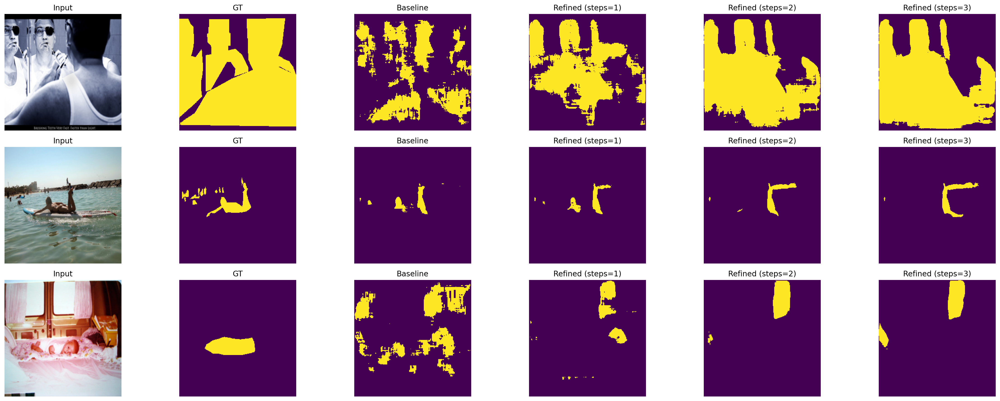

In [39]:
from experiments.diffusion_ablation import (
    run_task4_quant_ablation,
    visualize_baseline_vs_diffusion_steps,
)

# ---- Quantitative + ablation ----
baseline_metrics, df_full_refinement, df_ablation, refined_results_full, ablation_results = \
    run_task4_quant_ablation(
        baseline_model=baseline_model,
        diffusion_model=diffusion_model,
        test_loader=test_loader,
        num_classes=CLASSES,
        device=DEVICE,
        q_sample=q_sample,
        T=T,
        boundary_f1_single=boundary_f1_single,
        steps=(1, 2, 3),
        modes=("full", "no_image", "no_logits", "no_probs"),
    )

display(df_full_refinement)
display(df_ablation)

# Optional: save to Drive
df_full_refinement.to_csv(os.path.join(MODEL_RESULTS_DIR, "task4_baseline_vs_refined.csv"), index=False)
df_ablation.to_csv(os.path.join(MODEL_RESULTS_DIR, "task4_ablation.csv"), index=False)

# ---- Qualitative visualisation for best config ----
best_steps = max(refined_results_full.keys(),
                 key=lambda k: refined_results_full[k]["miou"])
print(f"Best full-conditioning steps by mIoU: {best_steps}")

visualize_baseline_vs_diffusion_steps(
    baseline_model=baseline_model,
    diffusion_model=diffusion_model,
    loader=test_loader,
    q_sample=q_sample,
    T=T,
    mean_rgb=MEAN_RGB,
    std_rgb=STDDEV_RGB,
    steps_to_show=(1, 2, 3),
    t_level=0,
    mode="full",
    num_samples=3,
    device=DEVICE,
)

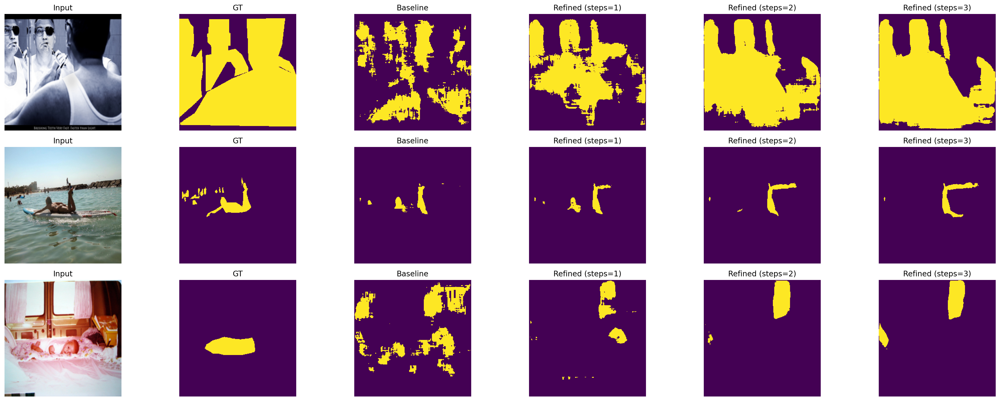

In [40]:
visualize_baseline_vs_diffusion_steps(
    baseline_model=baseline_model,
    diffusion_model=diffusion_model,
    loader=test_loader,
    q_sample=q_sample,
    T=T,
    mean_rgb=MEAN_RGB,
    std_rgb=STDDEV_RGB,
    steps_to_show=(1, 2, 3),
    t_level=best_t,
    mode="full",
    num_samples=3,
    device=DEVICE,
)

In [43]:
result = !cp -rv "/content/data" "/content/drive/MyDrive/mvp-final"
print(f"Transferred {len(result)} files.")

Transferred 59518 files.
